# Рынок заведений общественного питания Москвы

**Описание проекта**

Есть датасет с информацией о заведениях общественного питания в г. Москве. Необходимо провести анализ, выявить интересные особенности и подготовить презентационные материалы для инвесторов.

**Цель проекта:**
1. Подготовить исследование рынка общественного питания г. Москвы.
2. Дать рекомендации инвесторам, которые хотят открыть новое заведение, по результатам исследования

**Структура проекта**

**[1. Общая информация о данных](#1)**
* Загрузка данных.
* Изучение общей информации о данных: сколько заведений представлено, типы данных в столбцах.

**[2. Предобработка данных](#2)**
* Поиск дубликатов и обработка пропусков
* Создание столбца street с названиями улиц из столбца с адресом
* Создание столбца is_24/7 с обозначением, что заведение работает ежедневно и круглосуточно (24/7)

**[3. Анализ данных](#3)**
* [Распределение категорий заведений](#3.1)
* [Количество посадочных мест по категориям: рестораны, кофейни, пиццерии, бары и так далее.](#3.2)
* [Соотношение сетевых и несетевых заведений](#3.3)
* [Анализ категорий сетевых заведений](#3.4)
* [ТОП-15 популярных сетей Москвы по количеству заведений](#3.5)
* [Распределение заведений по районам Москвы](#3.6)
* [Распределение средних рейтингов по категориям заведений](#3.7)
* [Картограмма со средним рейтингом заведений по районам](#3.8)
* [Заведения на карте](#3.9)
* [ТОП-15 улицы Москвы по количеству заведений](#3.10)
* [Улицы с одним объектом общепита](#3.11)
* [Значение среднего чека по районам Москвы](#3.12)

**[4. Исследование открытия кофейни](#4)**
* [Количество кофеен и их расположение](#4.1)
* [График работы кофеен](#4.2)
* [Рейтинги кофеен и распределение по районам](#4.3)
* [Стоимость чашки капучино](#4.4)

**[5. Презентация для инвесторов](#5)**


In [1]:
# импортируем необходимые библиотеки
import pandas as pd
import seaborn as sns
import matplotlib.pyplot as plt
import plotly.express as px
import folium
from folium import Map, Choropleth, Marker
from folium.plugins import MarkerCluster

In [2]:
# устанавливаем темную тему для графиков и формат отображения чисел
sns.set_theme(style='darkgrid')
pd.options.display.float_format = '{:,.2f}'.format

<a id='1'></a>
## Общая информация о данных

In [3]:
# загружаем данные
places = pd.read_csv('datasets/moscow_places.csv')

In [4]:
# смотрим первые 5 строк для ознакомления
places.head()

,name,category,address,district,hours,lat,lng,rating,price,avg_bill,middle_avg_bill,middle_coffee_cup,chain,seats
0,WoWфли,кафе,"Москва, улица Дыбенко, 7/1",Северный административный округ,"ежедневно, 10:00–22:00",55.88,37.48,5.00,NaN,NaN,NaN,NaN,0,NaN
1,Четыре комнаты,ресторан,"Москва, улица Дыбенко, 36, корп. 1",Северный административный округ,"ежедневно, 10:00–22:00",55.88,37.48,4.50,выше среднего,Средний счёт:1500–1600 ₽,"1,550.00",NaN,0,4.00
2,Хазри,кафе,"Москва, Клязьминская улица, 15",Северный административный округ,"пн-чт 11:00–02:00; пт,сб 11:00–05:00; вс 11:00...",55.89,37.53,4.60,средние,Средний счёт:от 1000 ₽,"1,000.00",NaN,0,45.00
3,Dormouse Coffee Shop,кофейня,"Москва, улица Маршала Федоренко, 12",Северный административный округ,"ежедневно, 09:00–22:00",55.88,37.49,5.00,NaN,Цена чашки капучино:155–185 ₽,NaN,170.00,0,NaN
4,Иль Марко,пиццерия,"Москва, Правобережная улица, 1Б",Северный административный округ,"ежедневно, 10:00–22:00",55.88,37.45,5.00,средние,Средний счёт:400–600 ₽,500.00,NaN,1,148.00


In [5]:
# получаем информацию о датафрэйме
places.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 8406 entries, 0 to 8405
Data columns (total 14 columns):
 #   Column             Non-Null Count  Dtype  
---  ------             --------------  -----  
 0   name               8406 non-null   object 
 1   category           8406 non-null   object 
 2   address            8406 non-null   object 
 3   district           8406 non-null   object 
 4   hours              7870 non-null   object 
 5   lat                8406 non-null   float64
 6   lng                8406 non-null   float64
 7   rating             8406 non-null   float64
 8   price              3315 non-null   object 
 9   avg_bill           3816 non-null   object 
 10  middle_avg_bill    3149 non-null   float64
 11  middle_coffee_cup  535 non-null    float64
 12  chain              8406 non-null   int64  
 13  seats              4795 non-null   float64
dtypes: float64(6), int64(1), object(7)
memory usage: 919.5+ KB


In [6]:
print('Всего заведений в данных:', places.name.nunique())

Всего заведений в данных: 5614


**Выводы:**
- Всего в данных 8406 записей.
- Число уникальных заведений в данных 5614.
- Данные представлены типами float, int и object. 

**Что будем делать с пропусками:**
- Проверим была ли информация по среднему чеку по связки сеть + категория и если была, заполним другие заведения этой сети этими данными.

<a id='2'></a>
## Предобработка данных

In [7]:
# проверим на явные дубликаты
print('Число явных дубликатов:', places.duplicated().sum())

Число явных дубликатов: 0


In [8]:
# сделаем копию исходного датафрэйма
spots = places.copy()
# приведем названия заведений к нижнему регистру и поищем дубликаты по связке название - адрес
spots['name'] = spots['name'].str.lower()
spots[spots[['name', 'address']].duplicated(keep=False)]

,name,category,address,district,hours,lat,lng,rating,price,avg_bill,middle_avg_bill,middle_coffee_cup,chain,seats
1430,more poke,ресторан,"Москва, Волоколамское шоссе, 11, стр. 2",Северный административный округ,"ежедневно, 09:00–21:00",55.81,37.50,4.20,NaN,NaN,NaN,NaN,0,188.00
1511,more poke,ресторан,"Москва, Волоколамское шоссе, 11, стр. 2",Северный административный округ,"пн-чт 09:00–18:00; пт,сб 09:00–21:00; вс 09:00...",55.81,37.50,4.20,NaN,NaN,NaN,NaN,1,188.00
2211,раковарня клешни и хвосты,ресторан,"Москва, проспект Мира, 118",Северо-Восточный административный округ,"ежедневно, 12:00–00:00",55.81,37.64,4.40,NaN,NaN,NaN,NaN,0,150.00
2420,раковарня клешни и хвосты,"бар,паб","Москва, проспект Мира, 118",Северо-Восточный административный округ,"пн-чт 12:00–00:00; пт,сб 12:00–01:00; вс 12:00...",55.81,37.64,4.40,NaN,NaN,NaN,NaN,1,150.00
3091,хлеб да выпечка,булочная,"Москва, Ярцевская улица, 19",Западный административный округ,"ежедневно, 09:00–22:00",55.74,37.41,4.10,NaN,NaN,NaN,NaN,1,276.00
3109,хлеб да выпечка,кафе,"Москва, Ярцевская улица, 19",Западный административный округ,NaN,55.74,37.41,4.10,NaN,NaN,NaN,NaN,0,276.00


In [9]:
# задублированы заведения more poke, раковарня и хлеб да выпечка.
# удалим дубликаты из исходного датафрэйма, оставим те строки, где chain = 0.
places.drop(places.query('chain == 1 & lat == 55.806307 | lat == 55.810677 | lat == 55.738886').index, inplace=True)
# проверим, что в датафрэйме стало на 3 строчки меньше
places.shape

(8403, 14)

In [10]:
# по некоторым сетям указана сумма среднего чека не во всех заведениях
# заполним значениями среднего чека каждой сети пропуски в соответствующей сети
# аналогично поступим с middle_coffee_cup

#for name in pd.Series(places.query('chain == 1')['name'].unique()):
#    avg_bill = places.query('name == @name & middle_avg_bill != 0')['middle_avg_bill'].median()
#    places.loc[places['name'] == name, 'middle_avg_bill'] = places.query('name == @name')['middle_avg_bill'].fillna(value=avg_bill)
#    avg_coffee = places.query('name == @name & middle_avg_bill != 0')['middle_coffee_cup'].median()
#    places.loc[places['name'] == name, 'middle_coffee_cup'] = places.query('name == @name')['middle_coffee_cup'].fillna(value=avg_coffee)

In [11]:
# проверим на примере Буханки, что колонка middle_avg_bill заполнилась
places.query('name == "Буханка" & category == "булочная"')

,name,category,address,district,hours,lat,lng,rating,price,avg_bill,middle_avg_bill,middle_coffee_cup,chain,seats
13,Буханка,булочная,"Москва, Базовская улица, 15, корп. 1",Северный административный округ,"ежедневно, 08:00–22:00",55.88,37.50,4.80,NaN,NaN,NaN,NaN,1,180.00
23,Буханка,булочная,"Москва, Лобненская улица, 13к2",Северный административный округ,"ежедневно, 08:00–22:00",55.89,37.53,4.70,NaN,NaN,NaN,NaN,1,NaN
179,Буханка,булочная,"Москва, Юрловский проезд, 14, корп. 3",Северо-Восточный административный округ,"ежедневно, 08:00–22:00",55.88,37.61,4.30,NaN,NaN,NaN,NaN,1,NaN
245,Буханка,булочная,"Москва, проезд Шокальского, 33",Северо-Восточный административный округ,"ежедневно, 08:00–22:00",55.88,37.65,4.20,средние,Средний счёт:200–350 ₽,275.00,NaN,1,NaN
258,Буханка,булочная,"Москва, Полярная улица, 27, корп. 2",Северо-Восточный административный округ,"ежедневно, 07:00–23:00",55.88,37.64,4.20,NaN,NaN,NaN,NaN,1,52.00
437,Буханка,булочная,"Москва, Левобережная улица, 4к10",Северный административный округ,"ежедневно, 07:00–22:00",55.87,37.48,4.30,NaN,NaN,NaN,NaN,1,NaN
522,Буханка,булочная,"Москва, Авангардная улица, 16",Северный административный округ,"ежедневно, 08:00–22:00",55.85,37.49,4.10,NaN,NaN,NaN,NaN,1,NaN
568,Буханка,булочная,"Москва, Кронштадтский бульвар, 6, корп. 4",Северный административный округ,"ежедневно, 08:00–22:00",55.84,37.49,4.20,NaN,NaN,NaN,NaN,1,NaN
765,Буханка,булочная,"Москва, Бескудниковский бульвар, 32, корп. 5",Северный административный округ,"ежедневно, 08:00–22:00",55.87,37.56,4.40,NaN,NaN,NaN,NaN,1,NaN
958,Буханка,булочная,"Москва, улица Коминтерна, 15к3",Северо-Восточный административный округ,"ежедневно, 07:00–22:00",55.87,37.69,4.10,NaN,NaN,NaN,NaN,1,NaN


In [12]:
places.info()

<class 'pandas.core.frame.DataFrame'>
Index: 8403 entries, 0 to 8405
Data columns (total 14 columns):
 #   Column             Non-Null Count  Dtype  
---  ------             --------------  -----  
 0   name               8403 non-null   object 
 1   category           8403 non-null   object 
 2   address            8403 non-null   object 
 3   district           8403 non-null   object 
 4   hours              7867 non-null   object 
 5   lat                8403 non-null   float64
 6   lng                8403 non-null   float64
 7   rating             8403 non-null   float64
 8   price              3315 non-null   object 
 9   avg_bill           3816 non-null   object 
 10  middle_avg_bill    3149 non-null   float64
 11  middle_coffee_cup  535 non-null    float64
 12  chain              8403 non-null   int64  
 13  seats              4792 non-null   float64
dtypes: float64(6), int64(1), object(7)
memory usage: 984.7+ KB


In [13]:
# создаем столбец с улицей, на которой находится заведение
places['street'] = places.address.str.split(', ', expand=True)[1]
# print('Список улиц Москвы, где находятся заведения:', places.street.unique())
print('Число улиц, на которых находятся заведения:', places.street.nunique())

Число улиц, на которых находятся заведения: 1448


In [14]:
# создаем столбец, что заведение работает 24/7 типа bool
places['is_24/7'] = places['hours'] == 'ежедневно, круглосуточно'

**Выводы:**
1. Удалили дубликаты заведений
2. Добавили колонку street с названием улицы.
3. Добавили колонку is_24/7 с указанием времени работы заведения типа bool.

<a id='3'></a>
## Анализ данных

<a id='3.1'></a>
### Распределение категорий заведений

In [15]:
print('В датасете представлены следующие категории заведений:', places['category'].unique())

В датасете представлены следующие категории заведений: ['кафе' 'ресторан' 'кофейня' 'пиццерия' 'бар,паб' 'быстрое питание'
 'булочная' 'столовая']


In [16]:
#fig, ax = plt.subplots(figsize=(8,3))
#ax = sns.histplot(data=places, x='category')
#plt.xticks(rotation=45)
#plt.title('Распределение количества заведений по категориям')
#plt.ylabel('Количество, шт.')
#plt.xlabel('Категория');

In [17]:
# посмотрим размер и доли каждой категории
places_by_cat = places.value_counts('category')\
                      .reset_index()\
                      .rename(columns={'count': 'cnt'})\
                      .sort_values(by='cnt')
places_by_cat['share'] = places_by_cat['cnt'] / places_by_cat['cnt'].sum() * 100
places_by_cat.sort_values(by='cnt', ascending=False)

,category,cnt,share
0,кафе,2378,28.30
1,ресторан,2042,24.30
2,кофейня,1413,16.82
3,"бар,паб",764,9.09
4,пиццерия,633,7.53
5,быстрое питание,603,7.18
6,столовая,315,3.75
7,булочная,255,3.03


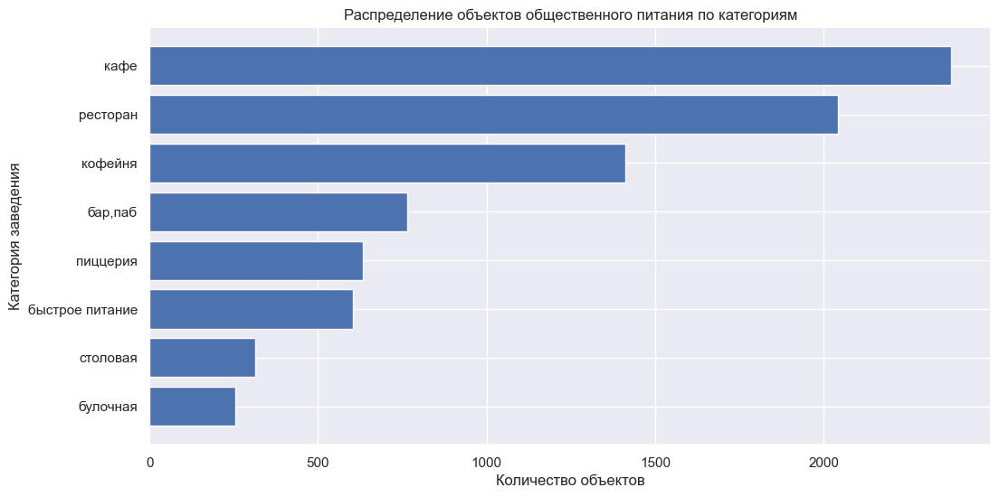

In [18]:
# визуализация результатов
plt.figure(figsize=(12,6))
plt.barh(places_by_cat.category, places_by_cat.cnt)
plt.title('Распределение объектов общественного питания по категориям')
plt.xlabel('Количество объектов')
plt.ylabel('Категория заведения')
plt.show()

**Выводы:**
- Основную долю заведений составляют кафе, рестораны и кофейни - в сумме почти 70%.
- Больше всего представлено кафе - 28.3% или 2378 заведений.
- Меньше всего столовых и булочных - всего около 7%.

<a id='3.2'></a>
### Количество посадочных мест по категориям: рестораны, кофейни, пиццерии, бары и так далее

In [19]:
# формируем список уникальных категорий для цикла
categories = pd.Series(places.category.unique()).to_list()

In [20]:
# посмотрим как распределяются средние и медианные значения количества мест в зависимости от категории заведения
places.groupby('category')['seats'].describe().sort_values(by='50%', ascending=False)

,count,mean,std,min,25%,50%,75%,max
category,,,,,,,,
ресторан,"1,269.00",121.89,123.79,0.00,48.00,86.00,150.00,"1,288.00"
"бар,паб",467.00,124.48,145.16,0.00,48.00,82.00,148.50,"1,288.00"
кофейня,751.00,111.20,127.84,0.00,40.00,80.00,144.00,"1,288.00"
столовая,164.00,99.75,122.95,0.00,40.00,75.50,117.00,"1,200.00"
быстрое питание,349.00,98.89,106.61,0.00,28.00,65.00,140.00,"1,040.00"
кафе,"1,218.00",97.51,117.99,0.00,35.25,60.00,120.00,"1,288.00"
пиццерия,427.00,94.50,112.28,0.00,30.00,55.00,120.00,"1,288.00"
булочная,147.00,88.12,96.79,0.00,25.00,50.00,120.00,625.00


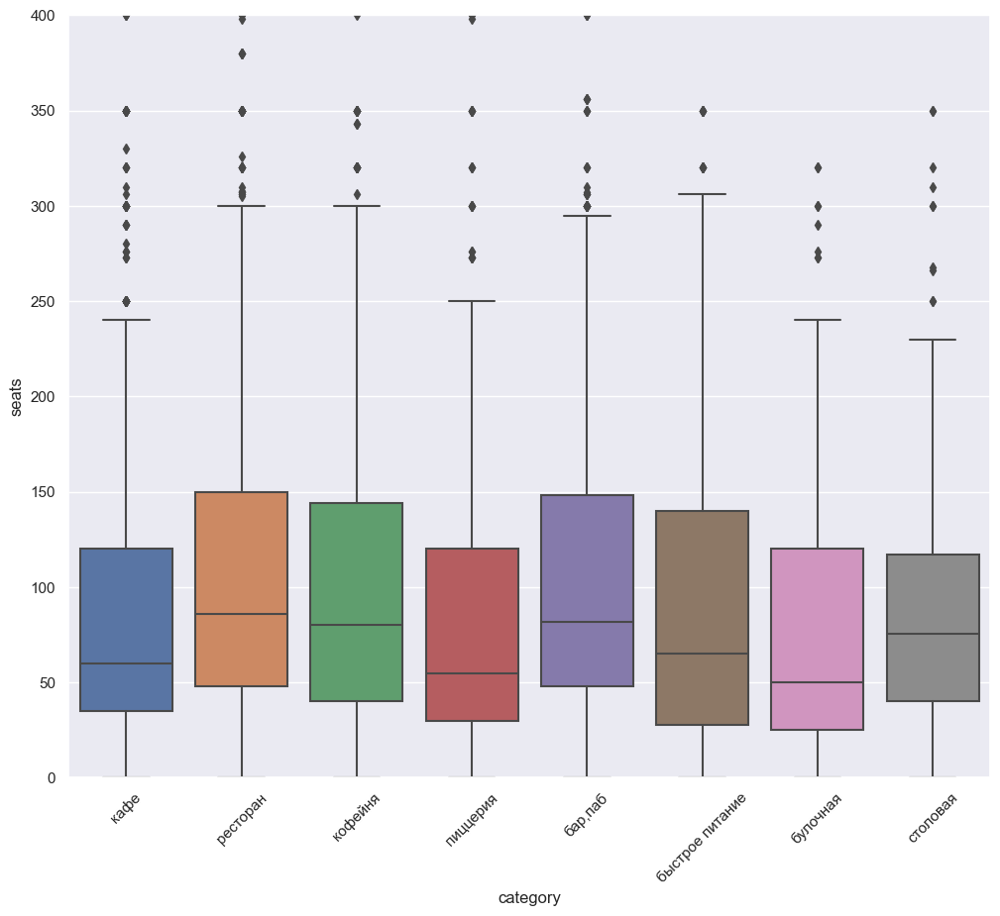

In [21]:
# построим диаграммы размаха, чтобы посмотреть на общее распределение по категориям
fig, ax = plt.subplots(figsize=(12,10))
sns.boxplot(data=places, x='category', y="seats").set(ylim=(0,400))
plt.xticks(rotation=45);

In [22]:
# построим гистограммы распределения количества мест в зависимости от категории заведения
#sns.displot(data=places, x="seats", col="category", kde=False, col_wrap = 2)
#plt.xlim(0, 400); # установим ограничение количества мест 400 - большее количество мест уже выброс

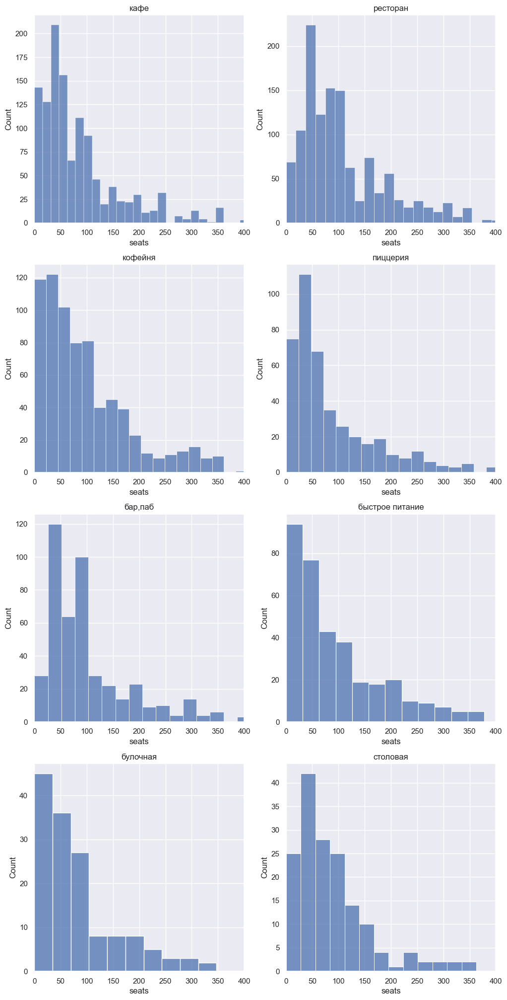

In [23]:
fig, ax = plt.subplots(ncols=2, nrows=4, figsize=(12,25))
n = 0
k = 0
for category in categories:
    sns.histplot(data=places.query('category == @category'), x="seats", kde=False, ax=ax[n,k]).set(title=category, xlim=(0,400))
    if k < 1:
        k += 1
    else:
        k = 0
        n += 1

**Выводы:**
1. Медианное значение количества мест находится в диапазоне 50-86.
2. Больше всего мест в ресторанах, пабах и кофейнях.
3. Меньше всего мест в булочных и пиццериях - около 50.

<a id='3.3'></a>
### Соотношение сетевых и несетевых заведений

In [24]:
places_by_chain = places.value_counts('chain')\
                      .reset_index()\
                      .rename(columns={'count': 'cnt'})
places_by_chain

,chain,cnt
0,0,5201
1,1,3202


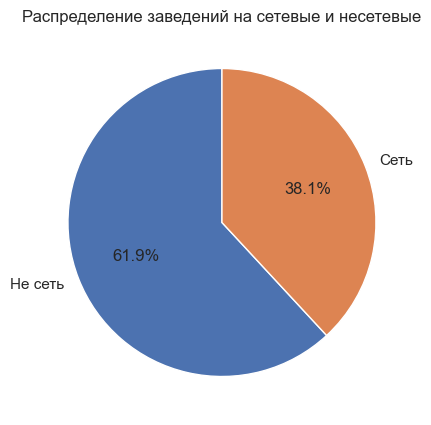

In [25]:
fig, ax = plt.subplots(figsize=(12,5))
plt.pie(x=places_by_chain['cnt'], labels = ['Не сеть', 'Сеть'], autopct='%1.1f%%', startangle=90)
plt.title('Распределение заведений на сетевые и несетевые')
plt.show();

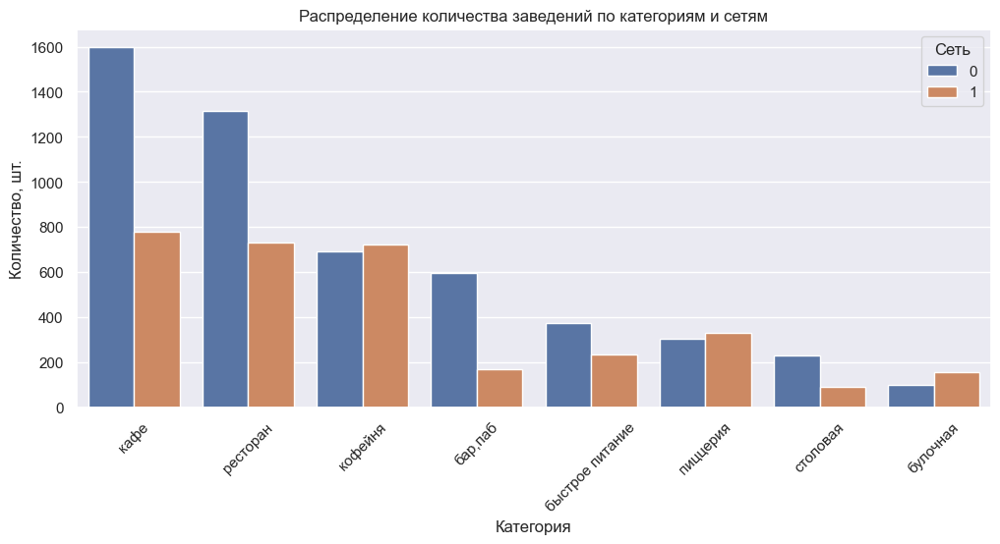

In [26]:
# сделаем разбивку заведений по категориям и критерию сеть / не сеть

places_by_cat_chain = places.value_counts(['category', 'chain'])\
                      .to_frame()\
                      .reset_index()\
                      .rename(columns={'count': 'cnt'})
fig, ax = plt.subplots(figsize=(12,5))
ax = sns.barplot(data=places_by_cat_chain, x='category', y='cnt', hue='chain')
plt.xticks(rotation=45)
plt.title('Распределение количества заведений по категориям и сетям')
plt.ylabel('Количество, шт.')
plt.xlabel('Категория')
plt.legend(title='Сеть');

**Выводы:**
- Доля сетевых заведений составляет 38.1%, не сетевых 61.9%.
- Большая часть кафе и ресторанов не являются сетевыми.
- Распределение кофеен между сетями и нет примерно 50 на 50.

<a id='3.4'></a>
### Анализ категорий сетевых заведений

In [27]:
# считаем количество сетевых заведений по категориям
chain_places = places.query('chain == True')['category']\
                     .value_counts()\
                     .reset_index()
# переименуем колонки
chain_places.rename(columns={'count': 'cnt'}, inplace=True)

# считаем количество сетевых заведений по категориям
non_chain_places = places.query('chain == False')['category']\
                     .value_counts()\
                     .reset_index()
# переименуем колонки
non_chain_places.rename(columns={'count': 'cnt'}, inplace=True)

In [28]:
chain_places

,category,cnt
0,кафе,779
1,ресторан,729
2,кофейня,720
3,пиццерия,330
4,быстрое питание,232
5,"бар,паб",168
6,булочная,156
7,столовая,88


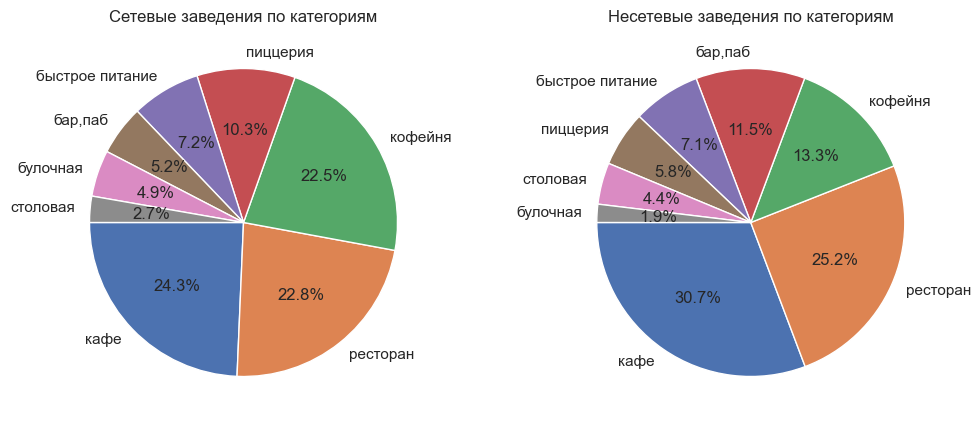

In [29]:
fig, ax = plt.subplots(ncols=2, figsize=(12,5))
ax[0].pie(x=chain_places['cnt'], labels = chain_places['category'], autopct='%1.1f%%', startangle=180)
ax[1].pie(x=non_chain_places['cnt'], labels = non_chain_places['category'], autopct='%1.1f%%', startangle=180)
ax[0].set_title('Сетевые заведения по категориям')
ax[1].set_title('Несетевые заведения по категориям')
plt.show()

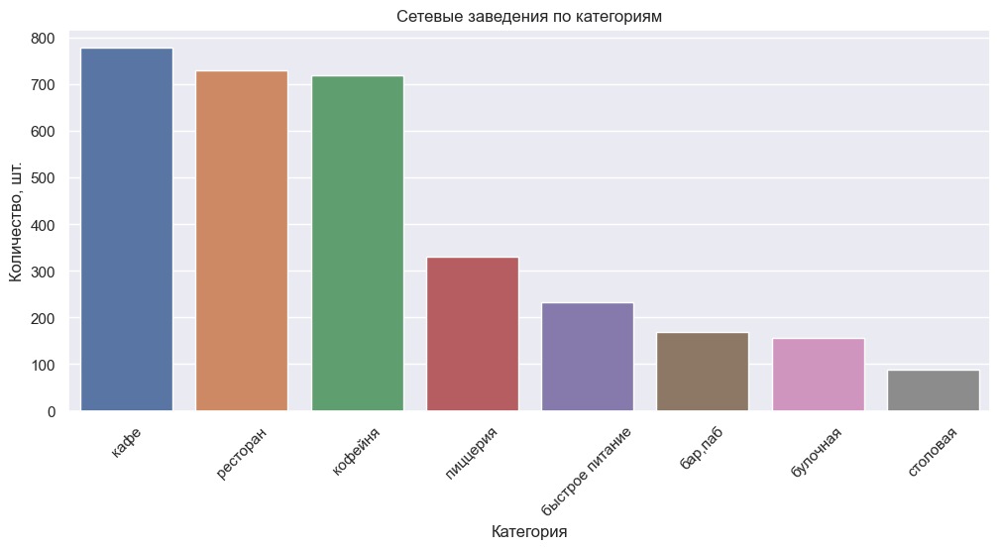

In [30]:
fig, ax = plt.subplots(figsize=(12,5))
ax = sns.barplot(data=chain_places, x='category', y='cnt')
plt.title('Сетевые заведения по категориям')
plt.ylabel('Количество, шт.')
plt.xlabel('Категория')
plt.xticks(rotation=45);

**Выводы:**
- Среди сетей, заведения почти равномерно распределены между кафе, ресторанами и кофейнями.
- Среди несетевых заведений основную долю составляют кафе и рестораны - в сумме почти 56%.

<a id='3.5'></a>
### ТОП-15 популярных сетей Москвы по количеству заведений

In [31]:
top_chain_places = places.query('chain == True')['name']\
                         .value_counts()\
                         .reset_index()\
                         .head(15)\
                         .rename(columns={'count':'cnt'})
top_chain_places

,name,cnt
0,Шоколадница,120
1,Домино'с Пицца,76
2,Додо Пицца,74
3,One Price Coffee,71
4,Яндекс Лавка,69
5,Cofix,65
6,Prime,50
7,Хинкальная,44
8,КОФЕПОРТ,42
9,Кулинарная лавка братьев Караваевых,39


In [32]:
# напишем функцию для переноса слов на графике
import textwrap
def wrap_labels(ax, width, break_long_words=False):
    labels = []
    for label in ax.get_xticklabels():
        text = label.get_text()
        labels.append(textwrap.fill(text, width=width,
                      break_long_words=break_long_words))
    ax.set_xticklabels(labels, rotation=45)

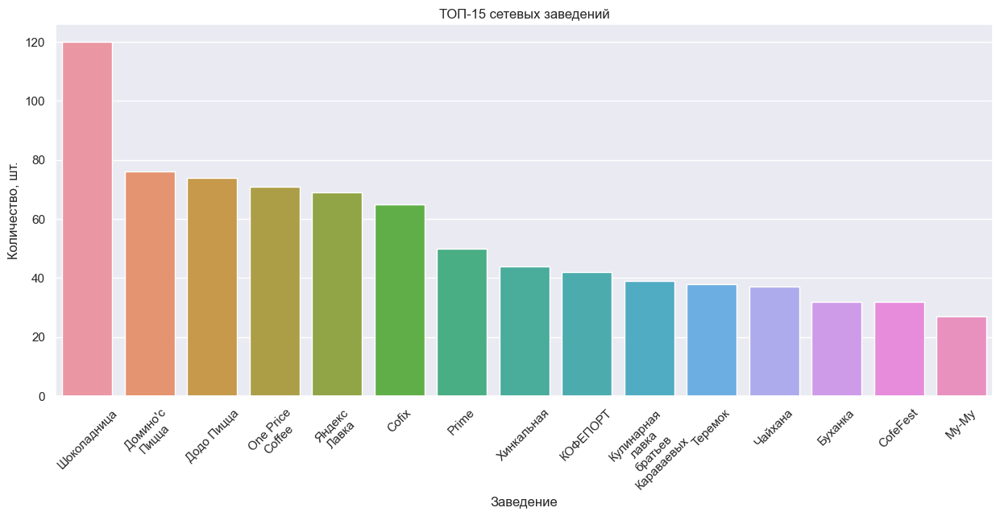

In [33]:
# строим барплот с топ 15 сетевыми заведениями
plt.figure(figsize=(15,6))
ax = sns.barplot(data=top_chain_places, x='name', y='cnt')
plt.xticks(rotation=70)
plt.title('ТОП-15 сетевых заведений')
plt.ylabel('Количество, шт.')
plt.xlabel('Заведение')
wrap_labels(ax, 10)
ax.figure;

In [34]:
# присоединим к названиям сетей категории и посмотрим разбивку по ним
top_chain_places_by_cat = top_chain_places.merge(places[['name','category']], on='name', how='left')\
                                          .groupby('category', as_index=False)\
                                          .agg({'cnt':'count'})\
                                          .sort_values(by='cnt', ascending=False)\
                                          .reset_index(drop=True)
top_chain_places_by_cat['share'] = top_chain_places_by_cat['cnt'] / top_chain_places_by_cat['cnt'].sum() * 100
top_chain_places_by_cat

,category,cnt,share
0,кофейня,336,41.18
1,ресторан,186,22.79
2,пиццерия,151,18.50
3,кафе,100,12.25
4,булочная,25,3.06
5,быстрое питание,12,1.47
6,"бар,паб",4,0.49
7,столовая,2,0.25


In [35]:
# проверим, что общее количество мест не изменилось в двух датафреймах
top_chain_places_by_cat.cnt.sum() == top_chain_places.cnt.sum()

True

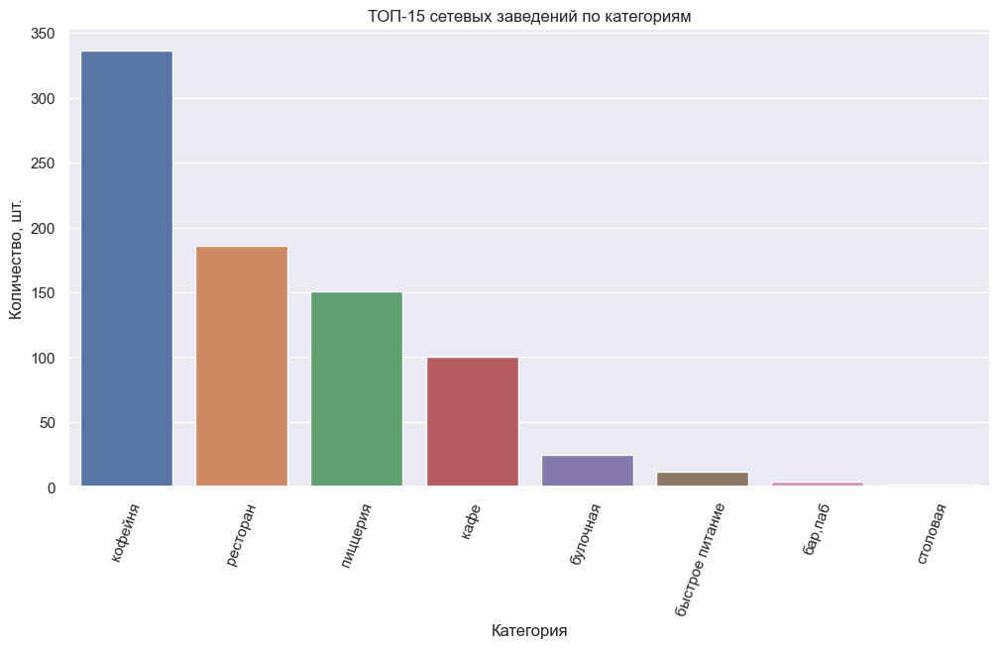

In [36]:
plt.figure(figsize=(12,6))
sns.barplot(data=top_chain_places_by_cat, x='category', y='cnt')
plt.xticks(rotation=70)
plt.title('ТОП-15 сетевых заведений по категориям')
plt.ylabel('Количество, шт.')
plt.xlabel('Категория');

**Выводы:**
- Со значительным отрывом по числу заведений лидирует кофейня Шоколадница - 120 заведений!
- Число кофеен среди топ-15 заведений Москвы составляет 336 штук или 41%, далее идут рестораны (23%) и пиццерии (18.5%)

<a id='3.6'></a>
### Распределение заведений по районам Москвы

In [37]:
print('Список административных районов:', places.district.unique())

Список административных районов: ['Северный административный округ'
 'Северо-Восточный административный округ'
 'Северо-Западный административный округ'
 'Западный административный округ' 'Центральный административный округ'
 'Восточный административный округ' 'Юго-Восточный административный округ'
 'Южный административный округ' 'Юго-Западный административный округ']


In [38]:
# сгруппируем данные в разрезе районов и категорий
places_by_dist = places.groupby(['district', 'category'], as_index=False)\
                       .agg({'name':'count'}).rename(columns={'name':'cnt'})\
                       .sort_values(by='cnt', ascending=False)\
                       .reset_index(drop=True)
places_by_dist

,district,category,cnt
0,Центральный административный округ,ресторан,670
1,Центральный административный округ,кафе,464
2,Центральный административный округ,кофейня,428
3,Центральный административный округ,"бар,паб",364
4,Юго-Восточный административный округ,кафе,282
...,...,...,...
67,Северо-Западный административный округ,"бар,паб",23
68,Северо-Западный административный округ,столовая,18
69,Юго-Западный административный округ,столовая,17
70,Юго-Восточный административный округ,булочная,13


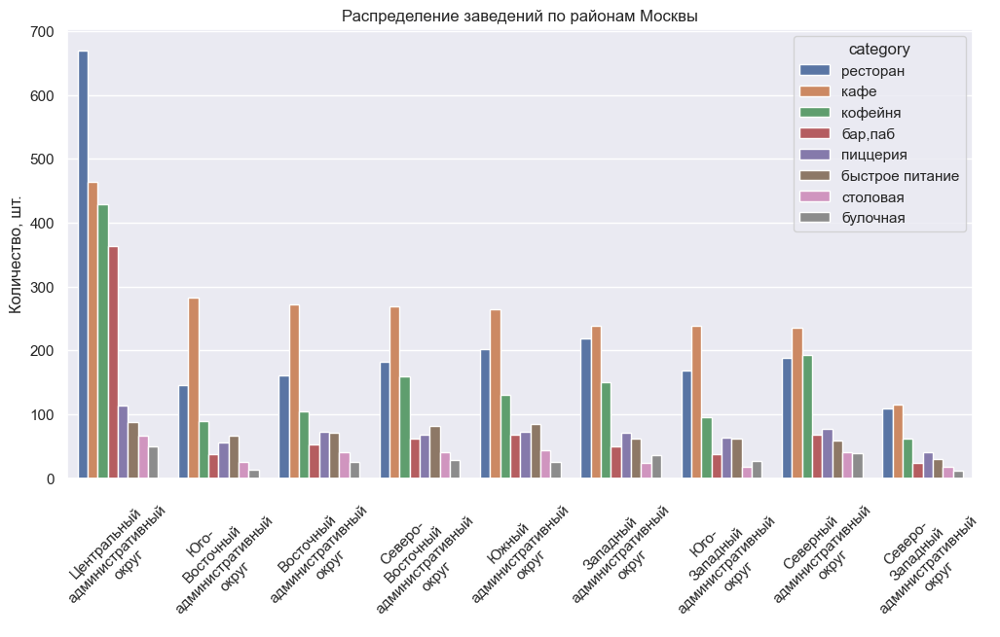

In [39]:
# строим график распределения заведений по районам и категориям
plt.figure(figsize=(12,6))
ax = sns.barplot(data=places_by_dist, x='district', y='cnt', hue='category')
plt.title('Распределение заведений по районам Москвы')
plt.ylabel('Количество, шт.')
plt.xlabel('')
wrap_labels(ax, 10)
ax.figure;

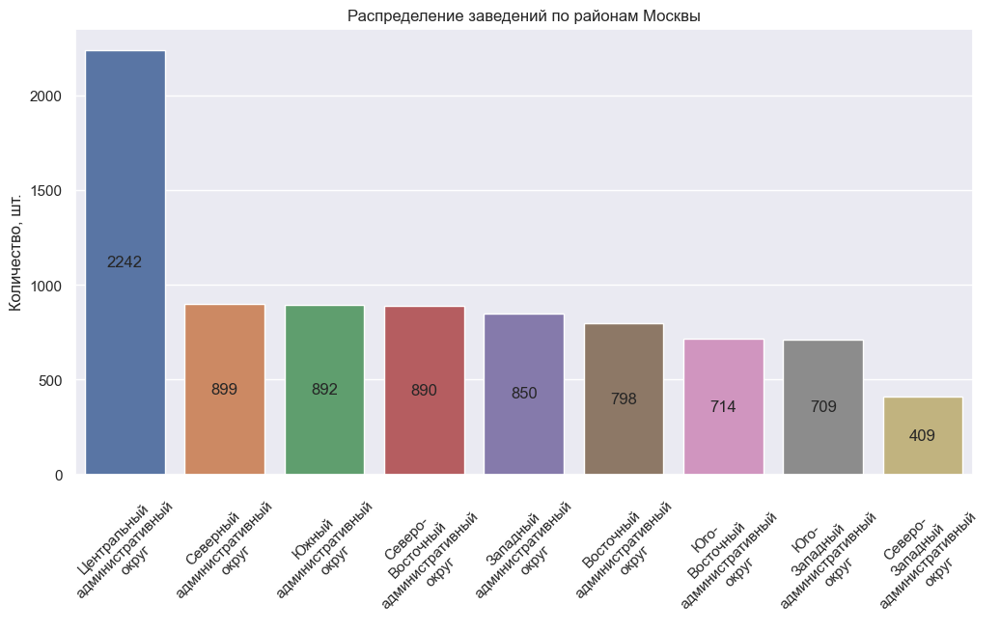

In [40]:
# также посмотрим распределение заведений по районам
plt.figure(figsize=(12,6))
ax = sns.barplot(data=places_by_dist\
                     .groupby('district', as_index=False)\
                     .agg({'cnt':'sum'})\
                     .reset_index()\
                     .sort_values(by='cnt', ascending=False), x='district', y='cnt')
plt.title('Распределение заведений по районам Москвы')
plt.ylabel('Количество, шт.')
plt.xlabel('')
wrap_labels(ax, 10)
for p in ax.patches:
    ax.annotate(format(p.get_height(), '.0f'), 
                (p.get_x() + p.get_width() / 2., p.get_height() / 2.), 
                ha = 'center', va = 'center', 
                xytext = (0, 0), 
                textcoords = 'offset points')


**Выводы:**
- Основная часть заведений представлена в ЦАО - 2242. 
- Между САО, ЮАО, СВАО и ЗАО заведения распределены практически равномерно - от 850 до 899.
- Меньше всего заведений в СЗАО - 409.

<a id='3.7'></a>
### Распределение средних рейтингов по категориям заведений

In [41]:
# сделаем расчет среднего рейтинга по категориям заведений
avg_rating = places.groupby('category', as_index=False)\
                   .agg({'rating':'mean'})\
                   .sort_values(by='rating', ascending=False)\
                   .reset_index(drop=True)
avg_rating

,category,rating
0,"бар,паб",4.39
1,пиццерия,4.30
2,ресторан,4.29
3,кофейня,4.28
4,булочная,4.27
5,столовая,4.21
6,кафе,4.12
7,быстрое питание,4.05


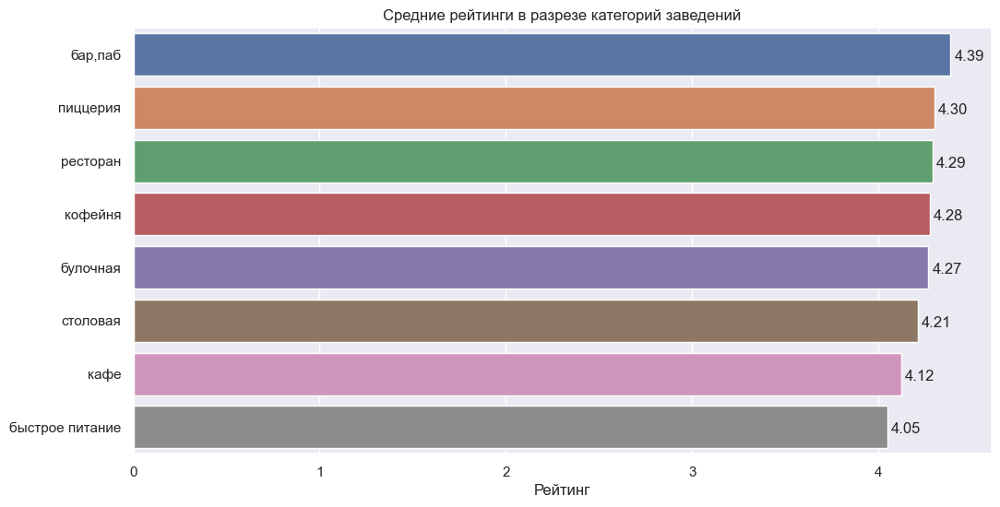

In [42]:
plt.figure(figsize=(12,6))
ax = sns.barplot(data=avg_rating, y='category', x='rating')
plt.title('Средние рейтинги в разрезе категорий заведений')
plt.ylabel('')
plt.xlabel('Рейтинг');
for p in ax.patches:
    width = p.get_width()
    plt.text(0.1 + p.get_width(), p.get_y()+0.55*p.get_height(),
             '{:.2f}'.format(width),
             ha='center', va='center')

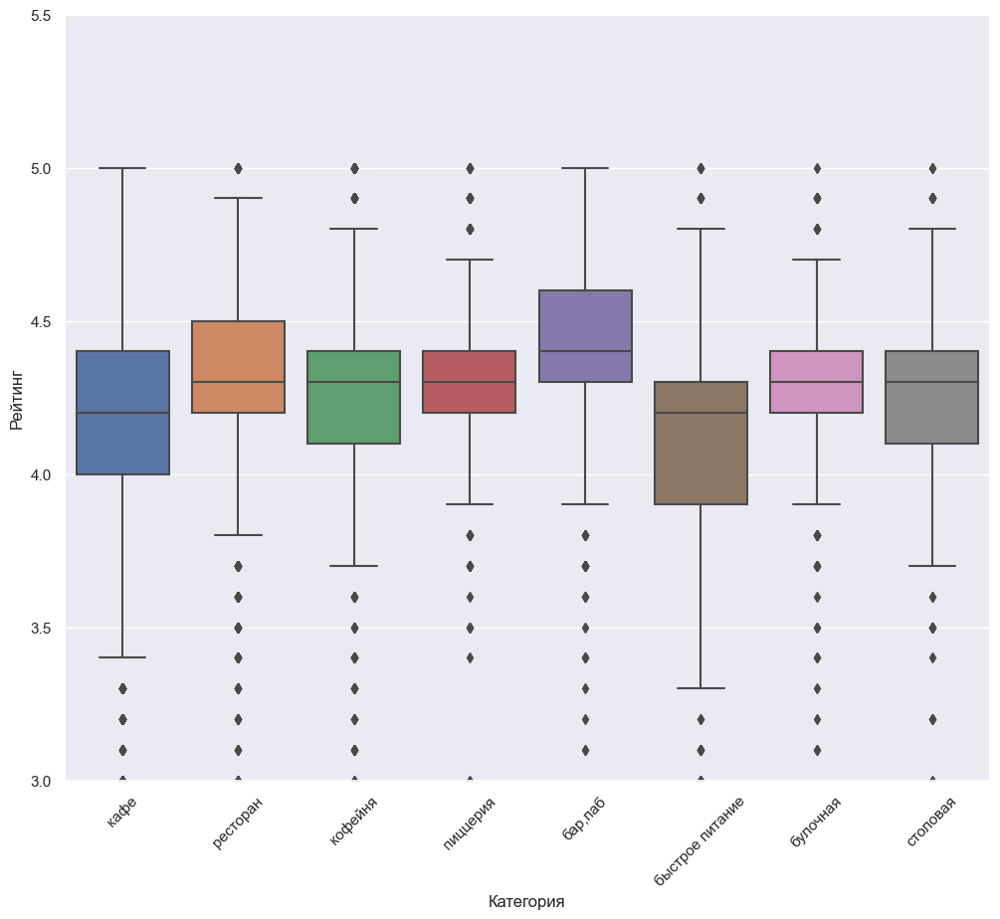

In [43]:
fig, ax = plt.subplots(figsize=(12,10))
sns.boxplot(data=places, x='category', y="rating").set(ylim=(3,5.5))
plt.xticks(rotation=45)
plt.xlabel('Категория')
plt.ylabel('Рейтинг');

**Выводы:**
- Средний рейтинг колеблется от 4.05 до 4.39 - разброс небольшой.
- Самые высокие рейтинги у баров и пабов.
- Самые низкие рейтинги у заведений быстрого питания.

<a id='3.8'></a>
### Картограмма со средним рейтингом заведений по районам

In [44]:
rating_by_dist = places.groupby('district', as_index=False).agg({'rating':'mean'}).sort_values(by='rating', ascending=False)
rating_by_dist

,district,rating
5,Центральный административный округ,4.38
2,Северный административный округ,4.24
4,Северо-Западный административный округ,4.21
8,Южный административный округ,4.18
1,Западный административный округ,4.18
0,Восточный административный округ,4.17
7,Юго-Западный административный округ,4.17
3,Северо-Восточный административный округ,4.15
6,Юго-Восточный административный округ,4.10


In [45]:
state_geo = 'datasets/admin_level_geomap.geojson'

# moscow_lat - широта центра Москвы, moscow_lng - долгота центра Москвы
moscow_lat, moscow_lng = 55.751244, 37.618423
# создаём объект m – карту с центром в точке с координатами [moscow_lat, moscow_lng]
m = folium.Map(location=[moscow_lat, moscow_lng])
# создаём хороплет с помощью конструктора Choropleth и добавляем его на карту
Choropleth(
    geo_data=state_geo,
    data=rating_by_dist,
    columns=['district', 'rating'],
    key_on='feature.name',
    fill_color='YlGn',
    fill_opacity=0.8,
    legend_name='Средний рейтинг заведений по районам',
).add_to(m)
# выводим карту
m

**Выводы:**
- Заведения с самым высоким рейтингом находятся в ЦАО.
- Заведения с самым низким рейтингом находятся в ЮВАО.

<a id='3.9'></a>
### Заведения на карте

In [46]:
# создаём пустой кластер, добавляем его на карту
marker_cluster = MarkerCluster().add_to(m)

# пишем функцию, которая принимает строку датафрейма,
# создаёт маркер в текущей точке и добавляет его в кластер marker_cluster
def create_clusters(row):
    Marker(
        [row['lat'], row['lng']],
        popup=f"{row['name']} {row['rating']}",
    ).add_to(marker_cluster)

# применяем функцию для создания маркера к первым 5 записям датафрейма
places.apply(create_clusters, axis=1)

# выводим карту
m    

<a id='3.10'></a>
### ТОП-15 улицы Москвы по количеству заведений

In [47]:
# сначала найдем топ-15 улиц по количеству заведений на них.
top_streets = places.groupby('street', as_index=False)\
                    .agg({'name':'count'})\
                    .rename(columns={'name':'cnt'})\
                    .sort_values(by='cnt', ascending=False)\
                    .head(15)
top_streets

,street,cnt
1090,проспект Мира,183
773,Профсоюзная улица,122
1087,проспект Вернадского,108
525,Ленинский проспект,107
523,Ленинградский проспект,95
373,Дмитровское шоссе,88
455,Каширское шоссе,77
298,Варшавское шоссе,76
524,Ленинградское шоссе,70
550,МКАД,65


In [48]:
# теперь сделаем группировку по улицам и категориям
places_by_category_and_street = places.groupby(['street','category'], as_index=False)\
                    .agg({'name':'count'})\
                    .rename(columns={'name':'cnt'})\
                    .sort_values(by='cnt', ascending=False)
places_by_category_and_street

,street,category,cnt
2860,проспект Мира,кафе,53
2863,проспект Мира,ресторан,45
1380,МКАД,кафе,45
2861,проспект Мира,кофейня,36
1989,Профсоюзная улица,кафе,35
...,...,...,...
1531,Моховая улица,"бар,паб",1
1533,Мукомольный проезд,булочная,1
1534,Мукомольный проезд,быстрое питание,1
1535,Мукомольный проезд,пиццерия,1


In [49]:
top_streets.cnt.sum()

1257

In [50]:
# объединим два датафрэйма, чтобы понять какие категории заведений представлены на топ-15 улицах Москвы
top_streets = top_streets.merge(places_by_category_and_street, on='street', how='left')
top_streets

,street,cnt_x,category,cnt_y
0,проспект Мира,183,кафе,53
1,проспект Мира,183,ресторан,45
2,проспект Мира,183,кофейня,36
3,проспект Мира,183,быстрое питание,21
4,проспект Мира,183,пиццерия,11
...,...,...,...,...
106,Пятницкая улица,48,кафе,7
107,Пятницкая улица,48,кофейня,6
108,Пятницкая улица,48,булочная,3
109,Пятницкая улица,48,пиццерия,3


In [51]:
top_streets.cnt_y.sum()

1257

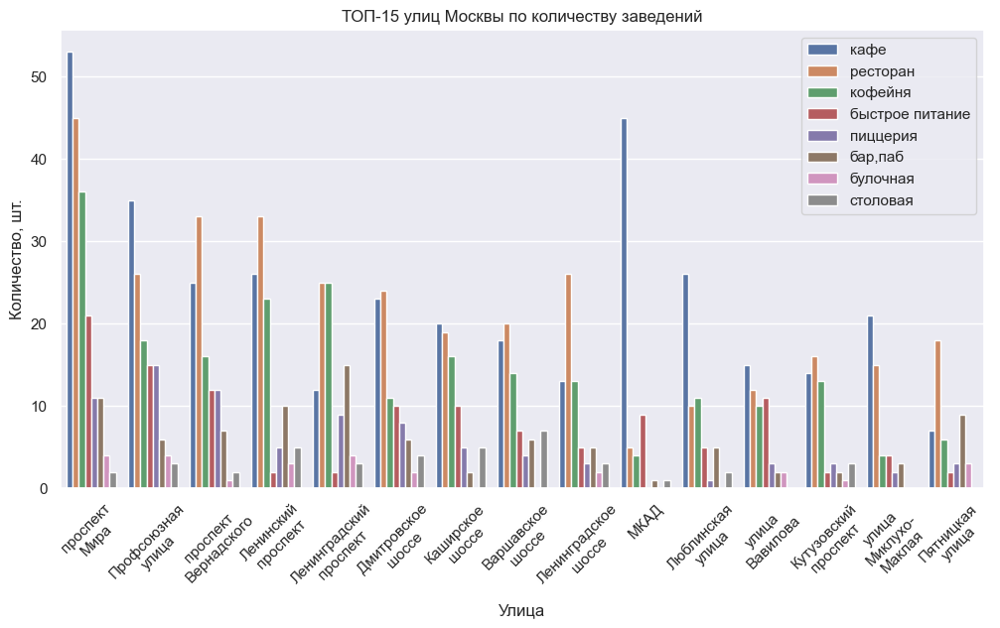

In [52]:
plt.figure(figsize=(12,6))
ax = sns.barplot(data=top_streets, x='street', y='cnt_y', hue='category')
plt.title('ТОП-15 улиц Москвы по количеству заведений')
plt.ylabel('Количество, шт.')
plt.xlabel('Улица')
plt.legend(loc='upper right')
wrap_labels(ax, 10)
ax.figure;

**Выводы:**
- Самым популярным по количеству заведений является проспект Мира - там представлено 183 заведения. В основном там представлены кафе, рестораны и кофейни.
- На МКАДе число кафе явно превалирует над остальными категориями.
- Само по себе количество заведений на конкретной улице может быть не особо информативно. В рамках дополнительного исследования можно было бы изучить количество заведений на один километр улицы.

<a id='3.11'></a>
### Улицы с одним объектом общепита

In [53]:
# посмотрим улицы, где находится один объект общепита
one_place_streets = places.groupby('street', as_index=False)\
                          .agg({'name':'count'})\
                          .rename(columns={'name':'cnt'})\
                          .sort_values(by='cnt')\
                          .query('cnt == 1')

one_place_streets

,street,cnt
0,1-й Автозаводский проезд,1
683,Одинцовская улица,1
689,Октябрьский переулок,1
694,Ордынский тупик,1
695,Оренбургская улица,1
...,...,...
124,3-й Хорошёвский проезд,1
217,Бобров переулок,1
218,Богословский переулок,1
138,4-й Лесной переулок,1


In [54]:
# добавим в эту таблицу район и наименование заведения
one_place_streets = one_place_streets.merge(places, on='street', how='left')
one_place_streets

,street,cnt,name,category,address,district,hours,lat,lng,rating,price,avg_bill,middle_avg_bill,middle_coffee_cup,chain,seats,is_24/7
0,1-й Автозаводский проезд,1,Чайхана Азия,кафе,"Москва, 1-й Автозаводский проезд, 5",Южный административный округ,"ежедневно, круглосуточно",55.70,37.66,4.20,средние,Средний счёт:190–350 ₽,270.00,NaN,1,20.00,True
1,Одинцовская улица,1,Монастырская трапеза,столовая,"Москва, Одинцовская улица, 24с18",Северо-Западный административный округ,"ежедневно, 09:00–20:00",55.79,37.41,4.50,NaN,NaN,NaN,NaN,1,NaN,False
2,Октябрьский переулок,1,Кампа,ресторан,"Москва, Октябрьский переулок, 12",Северо-Восточный административный округ,"ежедневно, 10:00–22:00",55.79,37.61,4.10,средние,Средний счёт:800 ₽,800.00,NaN,0,48.00,False
3,Ордынский тупик,1,ABC Coffee Roasters,кофейня,"Москва, Ордынский тупик, 4А",Центральный административный округ,"пн-пт 08:00–22:00; сб,вс 10:00–22:00",55.74,37.62,4.50,NaN,NaN,NaN,NaN,1,NaN,False
4,Оренбургская улица,1,Шаурамус,кафе,"Москва, Оренбургская улица, 18",Восточный административный округ,"ежедневно, 09:00–21:00",55.71,37.86,3.00,NaN,NaN,NaN,NaN,0,NaN,False
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
453,3-й Хорошёвский проезд,1,Галерея вкуса,столовая,"Москва, 3-й Хорошёвский проезд, 5, стр. 6",Северный административный округ,пн-пт 09:00–19:00,55.77,37.54,4.20,средние,Средний счёт:250–400 ₽,325.00,NaN,1,NaN,False
454,Бобров переулок,1,Ex: Libris,кафе,"Москва, Бобров переулок, 6, стр. 2",Центральный административный округ,"ежедневно, 11:00–23:00",55.76,37.63,4.40,средние,Средний счёт:600–800 ₽,700.00,NaN,0,NaN,False
455,Богословский переулок,1,Циники,кофейня,"Москва, Богословский переулок, 8/15с1",Центральный административный округ,пн-чт 09:00–23:00; пт-вс 10:00–23:00,55.76,37.60,4.60,средние,Цена чашки капучино:250–350 ₽,NaN,300.00,0,NaN,False
456,4-й Лесной переулок,1,Prime,ресторан,"Москва, 4-й Лесной переулок, 4",Центральный административный округ,пн-пт 08:00–21:00,55.78,37.59,4.20,низкие,Средний счёт:300–400 ₽,350.00,NaN,1,220.00,False


In [55]:
one_place_streets.value_counts('district')

district
Центральный административный округ         145
Северо-Восточный административный округ     55
Восточный административный округ            52
Северный административный округ             52
Южный административный округ                43
Юго-Восточный административный округ        39
Западный административный округ             35
Северо-Западный административный округ      19
Юго-Западный административный округ         18
Name: count, dtype: int64

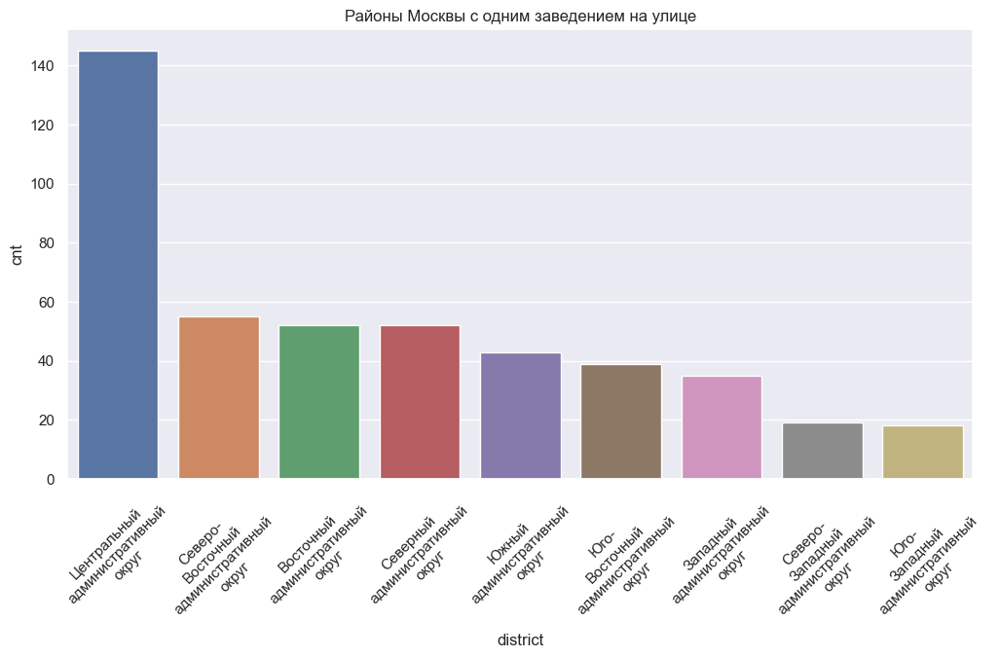

In [56]:
plt.figure(figsize=(12,6))
ax = sns.barplot(data=one_place_streets\
                 .groupby('district', as_index=False)\
                 .agg({'cnt':'sum'})\
                 .sort_values(by='cnt', ascending=False), x='district', y='cnt')
plt.title('Районы Москвы с одним заведением на улице')
wrap_labels(ax, 10)
ax.figure;

**Выводы:**
- Больше всего улиц с одним заведением представлено в ЦАО. Возможно это связано с тем, что это исторический центр и улицы там самые короткие.

<a id='3.12'></a>
### Значение среднего чека по районам Москвы

In [57]:
avg_bill = places.groupby('district', as_index=False)\
                 .agg({'middle_avg_bill':'median'})\
                 .sort_values(by='middle_avg_bill', ascending=False)                
avg_bill

,district,middle_avg_bill
1,Западный административный округ,"1,000.00"
5,Центральный административный округ,"1,000.00"
4,Северо-Западный административный округ,700.00
2,Северный административный округ,650.00
7,Юго-Западный административный округ,600.00
0,Восточный административный округ,575.00
3,Северо-Восточный административный округ,500.00
8,Южный административный округ,500.00
6,Юго-Восточный административный округ,450.00


In [58]:
state_geo = 'datasets/admin_level_geomap.geojson'

# moscow_lat - широта центра Москвы, moscow_lng - долгота центра Москвы
moscow_lat, moscow_lng = 55.751244, 37.618423
# создаём объект m – карту с центром в точке с координатами [moscow_lat, moscow_lng]
m = folium.Map(location=[moscow_lat, moscow_lng])
# создаём хороплет с помощью конструктора Choropleth и добавляем его на карту
Choropleth(
    geo_data=state_geo,
    data=avg_bill,
    columns=['district', 'middle_avg_bill'],
    key_on='feature.name',
    fill_color='YlGn',
    fill_opacity=0.8,
    legend_name='Медианный чек заведений по районам',
).add_to(m)
# выводим карту
m

**Выводы:**
- Самые высокий уровень среднего чека в ЦАО.
- Далее идут СЗАО, ЗАО и ЮЗАО.
- Самый низкий уровень среднего чека в ЮВАО.

***Общий вывод:***
1. Самый популярный тип заведений в городе - это кафе. Их 28.3% или 2378 штук.
2. Несетевых заведений больше - их доля составляет 61.9%.
3. Среди сетей заведения почти равномерно распределены между кафе, ресторанами и кофейнями - в сумме их доля составляет почти 70% от всего рынка сетевых заведений.
4. Самым популярным сетевым заведением является кофейня Шоколадница - 120 объектов в Москве. Если выделить ТОП15 сетевых заведений Москвы, то окажется, что самую большую долю займут кофейни с долей 41%.
5. Больше всего заведений работают в ЦАА - 2242. Меньше всего в СЗАО - всего 409.
6. Разброс рейтингов в зависимости от типа заведения небольшой. Самый высокий рейтинг у баров и пабов - 4.39, самый низкий у заведений быстрого питания - 4.05.
7. Самым популярным по количеству заведений является проспект Мира - там представлено 183 заведения. В основном там представлены кафе, рестораны и кофейни.
8. Больше всего улиц с одним заведением представлено в ЦАО. Возможно это связано с тем, что это исторический центр и улицы там самые короткие.
9. Самый высокий средний чек в ЦАО и ЗАО - 1000 рублей.

<a id='4'></a>
## Исследование открытия кофейни

In [59]:
# в датасет coffee отберем информацию о кофейнях
coffee = places.query('category == "кофейня"')
coffee

,name,category,address,district,hours,lat,lng,rating,price,avg_bill,middle_avg_bill,middle_coffee_cup,chain,seats,street,is_24/7
3,Dormouse Coffee Shop,кофейня,"Москва, улица Маршала Федоренко, 12",Северный административный округ,"ежедневно, 09:00–22:00",55.88,37.49,5.00,NaN,Цена чашки капучино:155–185 ₽,NaN,170.00,0,NaN,улица Маршала Федоренко,False
25,В парке вкуснее,кофейня,"Москва, парк Левобережный",Северный административный округ,"ежедневно, 10:00–21:00",55.88,37.46,4.30,NaN,NaN,NaN,NaN,1,NaN,парк Левобережный,False
45,9 Bar Coffee,кофейня,"Москва, Коровинское шоссе, 41, стр. 1",Северный административный округ,пн-пт 08:00–18:00,55.89,37.51,4.00,NaN,NaN,NaN,NaN,1,46.00,Коровинское шоссе,False
46,CofeFest,кофейня,"Москва, улица Маршала Федоренко, 6с1",Северный административный округ,пн-пт 09:00–19:00,55.88,37.49,3.60,NaN,NaN,NaN,NaN,1,NaN,улица Маршала Федоренко,False
52,Cofix,кофейня,"Москва, улица Дыбенко, 7/1",Северный административный округ,"ежедневно, 08:00–22:00",55.88,37.48,3.80,NaN,NaN,NaN,NaN,1,NaN,улица Дыбенко,False
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
8356,Назис Пури,кофейня,"Москва, Люблинская улица, 61",Юго-Восточный административный округ,"ежедневно, 09:00–22:00",55.68,37.74,4.50,NaN,NaN,NaN,NaN,0,NaN,Люблинская улица,False
8365,Квадрат кофе,кофейня,"Москва, Волгоградский проспект, 73, стр. 1",Юго-Восточный административный округ,"пн-пт 08:30–21:30; сб,вс 09:00–21:30",55.71,37.74,4.20,NaN,Цена чашки капучино:100–220 ₽,NaN,160.00,0,206.00,Волгоградский проспект,False
8376,Шоколад имбирь корица,кофейня,"Москва, Грайвороновская улица, 23",Юго-Восточный административный округ,пн-пт 09:30–19:30,55.72,37.74,4.10,NaN,NaN,NaN,NaN,0,NaN,Грайвороновская улица,False
8385,Cafio,кофейня,"Москва, Новохохловская улица, 49",Юго-Восточный административный округ,"пн-пт 07:00–22:00; сб,вс 07:00–21:00",55.72,37.72,4.70,NaN,Цена чашки капучино:80–120 ₽,NaN,100.00,0,NaN,Новохохловская улица,False


<a id='4.1'></a>
### Количество кофеен и их расположение

In [60]:
print(f'Всего в датасете представлено {coffee.category.count()} кофеен')

Всего в датасете представлено 1413 кофеен


In [61]:
coffee_by_dist = coffee.groupby('district', as_index=False)\
                      .agg({'name':'count'})\
                      .sort_values(by='name', ascending=False)\
                      .rename(columns={'name':'cnt'})\
                      .reset_index(drop=True)
coffee_by_dist

,district,cnt
0,Центральный административный округ,428
1,Северный административный округ,193
2,Северо-Восточный административный округ,159
3,Западный административный округ,150
4,Южный административный округ,131
5,Восточный административный округ,105
6,Юго-Западный административный округ,96
7,Юго-Восточный административный округ,89
8,Северо-Западный административный округ,62


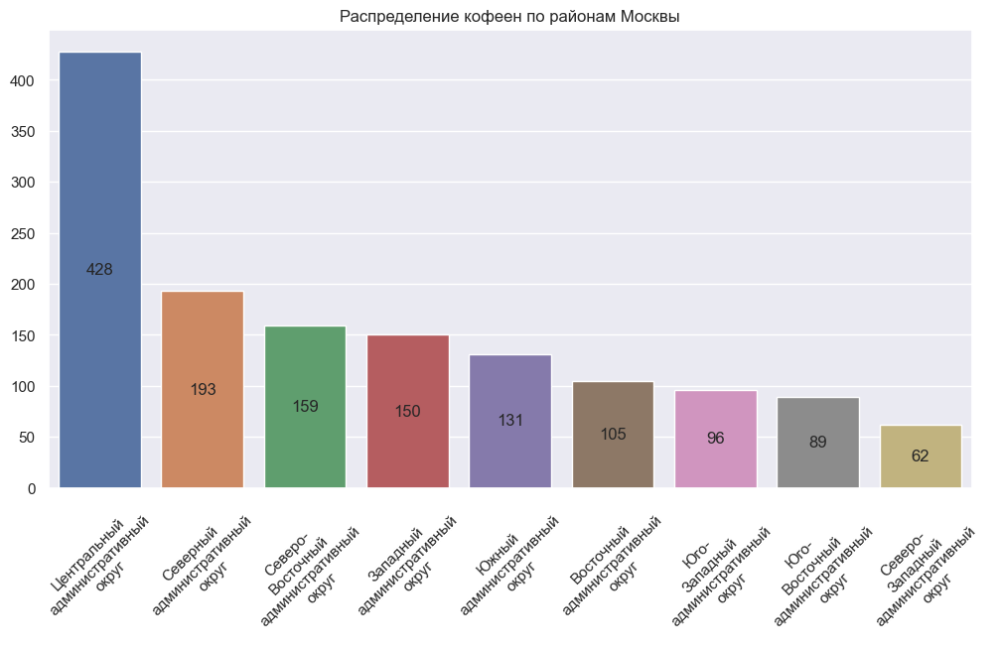

In [62]:
plt.figure(figsize=(12,6))
ax = sns.barplot(data=coffee_by_dist, x='district', y='cnt')
plt.title('Распределение кофеен по районам Москвы')
plt.xlabel('')
plt.ylabel('')
wrap_labels(ax, 10)
ax.figure;
for p in ax.patches:
    ax.annotate(format(p.get_height(), '.0f'), 
                (p.get_x() + p.get_width() / 2., p.get_height() / 2.), 
                ha = 'center', va = 'center', 
                xytext = (0, 0), 
                textcoords = 'offset points')


**Выводы:**
1. Всего в Москве представлено 1413 кофеен.
2. Со значительным отрывом по количеству кофеен лидирует ЦАО - 428 штук.

<a id='4.2'></a>
### График работы кофеен

In [63]:
coffee_wo_na = coffee[coffee['hours'].notna() == True]
coffee_wo_na.shape

(1398, 16)

In [64]:
# посмотрим уникальные часы работы кофеен
coffee_wo_na.hours.unique()

array(['ежедневно, 09:00–22:00', 'ежедневно, 10:00–21:00',
       'пн-пт 08:00–18:00', 'пн-пт 09:00–19:00', 'ежедневно, 08:00–22:00',
       'ежедневно, 10:00–22:00', 'ежедневно, 09:00–21:00',
       'пн-пт 08:00–19:00', 'ежедневно, 08:00–21:00',
       'пн-пт 09:00–22:00; сб 10:00–22:00; вс 10:00–21:00',
       'пн-пт 08:30–18:30', 'пн-пт 07:30–18:30', 'пн-пт 09:00–18:00',
       'ежедневно, 10:00–22:00, перерыв 16:00–16:20',
       'ежедневно, круглосуточно', 'пн-сб 09:00–20:00; вс 09:00–18:00',
       'пн-пт 08:00–21:00; сб,вс 09:00–21:00',
       'пн-чт 08:00–22:00; пт 08:00–23:00; сб,вс 09:00–23:00',
       'ежедневно, 08:00–20:00', 'ежедневно, 08:00–23:00',
       'пн-пт 08:00–21:00; сб,вс 10:00–21:00',
       'пн-пт 11:00–22:00; сб,вс 10:00–22:00',
       'пн-пт 08:00–22:00; сб,вс 09:00–22:00',
       'пн-чт 08:30–21:30; пт 08:30–22:00; сб,вс 09:30–22:00',
       'пн-сб 07:00–21:00; вс 08:00–20:00',
       'пн-пт 08:00–20:00; сб,вс 09:00–20:00', 'пн-сб 10:00–20:00',
       'ежед

In [65]:
# считаем число круглосуточных кофеен
coffee_wo_na[coffee_wo_na['hours'].str.contains('ежедневно, круглосуточно')]['name'].count()

59

In [66]:
coffee_wo_na[coffee_wo_na['hours'].str.contains('ежедневно, круглосуточно')].value_counts('district')

district
Центральный административный округ         26
Западный административный округ             9
Юго-Западный административный округ         7
Восточный административный округ            5
Северный административный округ             5
Северо-Восточный административный округ     3
Северо-Западный административный округ      2
Юго-Восточный административный округ        1
Южный административный округ                1
Name: count, dtype: int64

**Выводы:**
1. Круглосуточных кофеен немного - всего 59.
2. Больше всего круглосуточных кофеен также в ЦАО.

<a id='4.3'></a>
### Рейтинги кофеен и распределение по районам

In [67]:
# смотрим рейтинг по районам
coffee_rating_by_dist = coffee.groupby('district', as_index=False)\
                                          .agg({'rating':'mean'})\
                                          .sort_values(by='rating', ascending=False)
coffee_rating_by_dist

,district,rating
5,Центральный административный округ,4.34
4,Северо-Западный административный округ,4.33
2,Северный административный округ,4.29
7,Юго-Западный административный округ,4.28
0,Восточный административный округ,4.28
8,Южный административный округ,4.23
6,Юго-Восточный административный округ,4.23
3,Северо-Восточный административный округ,4.22
1,Западный административный округ,4.20


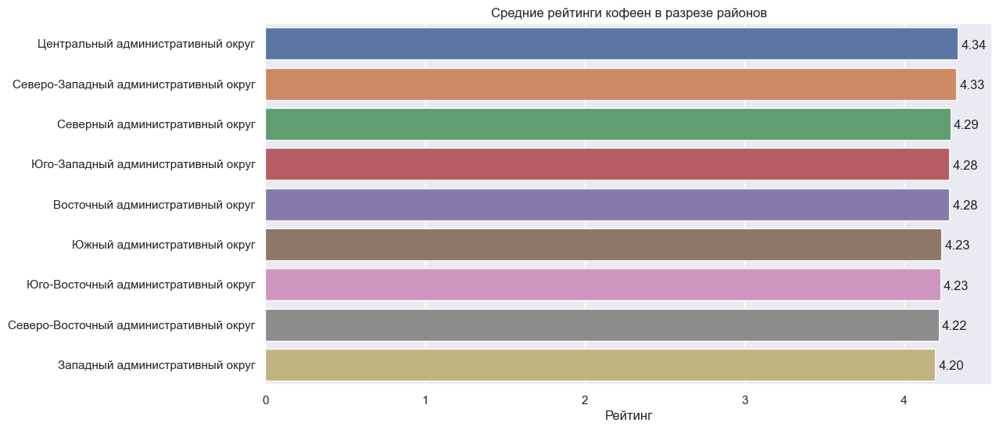

In [68]:
plt.figure(figsize=(12,6))
ax = sns.barplot(data=coffee_rating_by_dist, y='district', x='rating')
plt.title('Средние рейтинги кофеен в разрезе районов')
plt.ylabel('')
plt.xlabel('Рейтинг')
for p in ax.patches:
    width = p.get_width()
    plt.text(0.1 + p.get_width(), p.get_y()+0.55*p.get_height(),
             '{:.2f}'.format(width),
             ha='center', va='center')

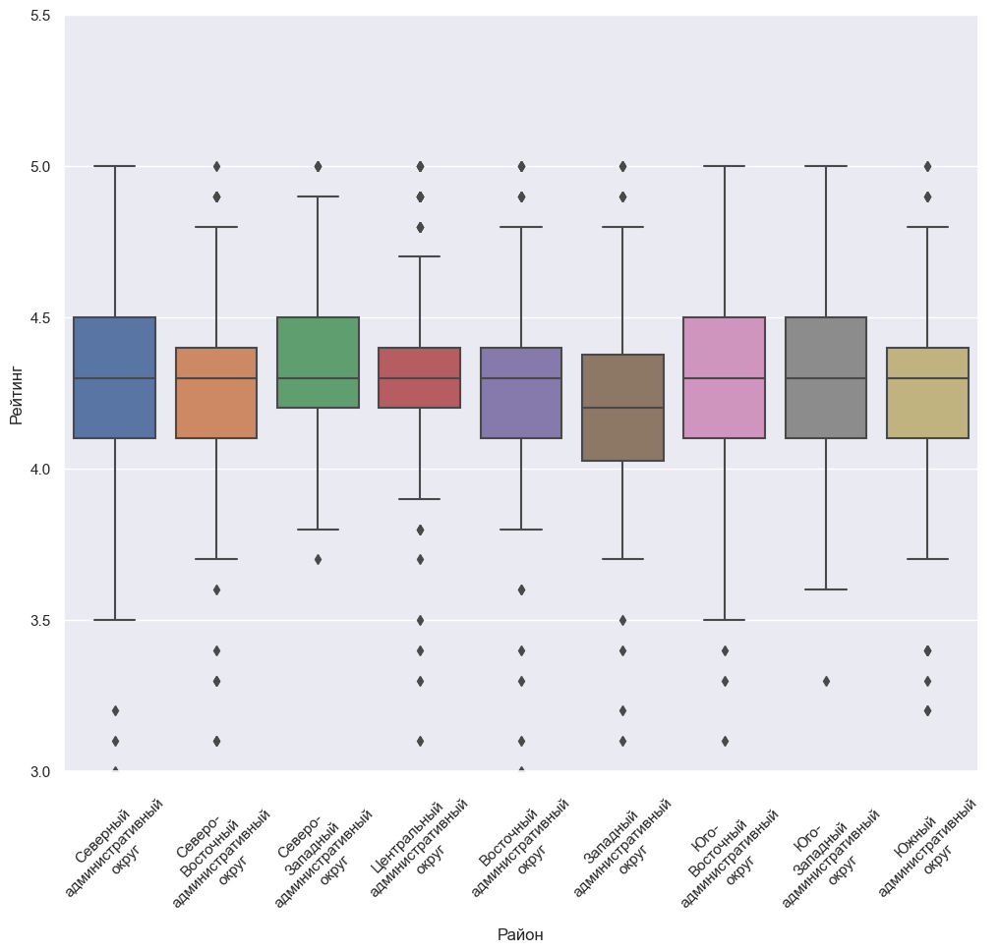

In [69]:
fig, ax = plt.subplots(figsize=(12,10))
sns.boxplot(data=coffee, x='district', y="rating").set(ylim=(3,5.5))
plt.xticks(rotation=45)
plt.xlabel('Район')
wrap_labels(ax, 10)
plt.ylabel('Рейтинг');

**Выводы:**
1. Самые высокие рейтинги у кофеен в ЦАО, СЗАО - 4.34 и 4.33.
2. Самые низкие рейтинги у кофеен в ЮАО, ЮВАО, СВАО и ЗАО - в диапазоне 4.20-4.23.

<a id='4.4'></a>
### Стоимость чашки капучино

In [70]:
# смотрим среднюю стоимость чашки кофе по районам
coffee_cup_by_dist = coffee.groupby('district', as_index=False)\
                                          .agg({'middle_coffee_cup':'mean'})\
                                          .sort_values(by='middle_coffee_cup', ascending=False)
coffee_cup_by_dist

,district,middle_coffee_cup
1,Западный административный округ,189.94
5,Центральный административный округ,187.52
7,Юго-Западный административный округ,184.18
0,Восточный административный округ,174.02
2,Северный административный округ,165.79
4,Северо-Западный административный округ,165.52
3,Северо-Восточный административный округ,165.33
8,Южный административный округ,158.49
6,Юго-Восточный административный округ,151.09


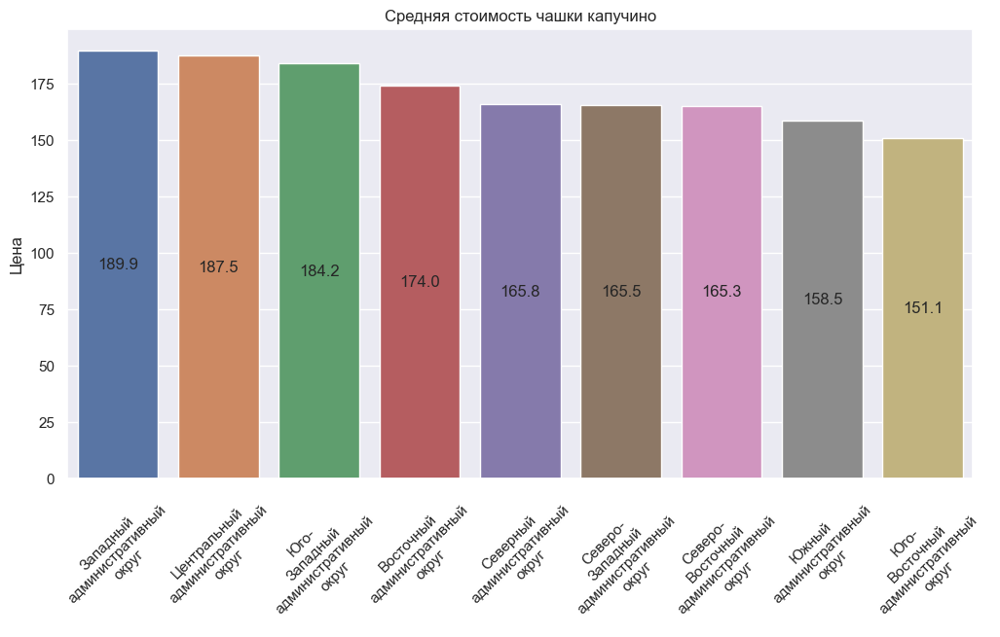

In [71]:
plt.figure(figsize=(12,6))
ax = sns.barplot(data=coffee_cup_by_dist, x='district', y='middle_coffee_cup')
plt.title('Средняя стоимость чашки капучино')
plt.xlabel('')
plt.ylabel('Цена')
wrap_labels(ax, 10)
ax.figure;
for p in ax.patches:
    ax.annotate(format(p.get_height(), '.1f'), 
                (p.get_x() + p.get_width() / 2., p.get_height() / 2.), 
                ha = 'center', va = 'center', 
                xytext = (0, 0), 
                textcoords = 'offset points')

**Выводы:**
1. Самая высокая средняя стоимость чашки капучино в ЗАО - 189.9 руб., ЦАО - 187.5 руб. и ЮЗАО - 184.2 руб.
2. Самая низкая стоимость в ЮВАО - около 151.1 руб.
3. По другим районам Москвы стоимость колеблется от 158.5 руб. до 174 руб.

<a id='5'></a>
## Презентация для инвесторов

Презентация: https://drive.google.com/file/d/1Yp0xMyZhXmB1oShBJqy0QZCWoRJxUdqS/view?usp=sharing/ 